In [1]:
import tensorflow_datasets as tfds
import tensorflow as tf

# Cargar el dataset sin formato supervisado
datos, metadatos = tfds.load('stanford_online_products', as_supervised=False, with_info=True)


In [2]:
#Imprimir los metadatos para revisarlos
metadatos

tfds.core.DatasetInfo(
    name='stanford_online_products',
    full_name='stanford_online_products/1.0.0',
    description="""
    Stanford Online Products Dataset
    """,
    homepage='http://cvgl.stanford.edu/projects/lifted_struct/',
    data_dir='/root/tensorflow_datasets/stanford_online_products/1.0.0',
    file_format=tfrecord,
    download_size=2.87 GiB,
    dataset_size=2.89 GiB,
    features=FeaturesDict({
        'class_id': ClassLabel(shape=(), dtype=int64, num_classes=22634),
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'super_class_id': ClassLabel(shape=(), dtype=int64, num_classes=12),
        'super_class_id/num': ClassLabel(shape=(), dtype=int64, num_classes=12),
    }),
    supervised_keys=None,
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=60502, num_shards=16>,
        'train': <SplitInfo num_examples=59551, num_shards=16>,
    },
    citation="""@inproceedings{song2016deep,
     author    = {Song, Hyun Oh 

,class_id,image,super_class_id,super_class_id/num
0,2773,,3 (coffee_maker),3
1,243,,0 (bicycle),0
2,2942,,3 (coffee_maker),3
3,214,,0 (bicycle),0
4,3283,,3 (coffee_maker),3

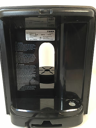
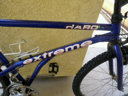
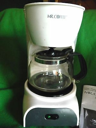
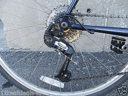
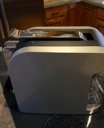

In [3]:
# Supongamos que los super_class_id correspondientes a las primeras cinco categorías son del 0 al 4
categorias_permitidas = [0, 1, 2, 3, 4]  # Corresponde a bicycle, cabinet, chair, coffee_maker, fan

# Filtrar el dataset de entrenamiento
datos['train'] = datos['train'].filter(lambda x: tf.reduce_any(tf.equal(x['super_class_id'], categorias_permitidas)))

# Filtrar el dataset de prueba
datos['test'] = datos['test'].filter(lambda x: tf.reduce_any(tf.equal(x['super_class_id'], categorias_permitidas)))

#Una forma de mostrar 5 ejemplos del set
tfds.as_dataframe(datos['train'].take(5), metadatos)

,class_id,image,super_class_id,super_class_id/num
0,2773,,3 (coffee_maker),3
1,243,,0 (bicycle),0
2,2942,,3 (coffee_maker),3
3,214,,0 (bicycle),0
4,3283,,3 (coffee_maker),3

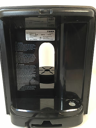
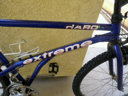
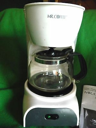
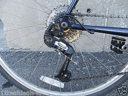
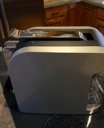

In [4]:
#Una forma de mostrar 5 ejemplos del set
tfds.as_dataframe(datos['train'].take(5), metadatos)

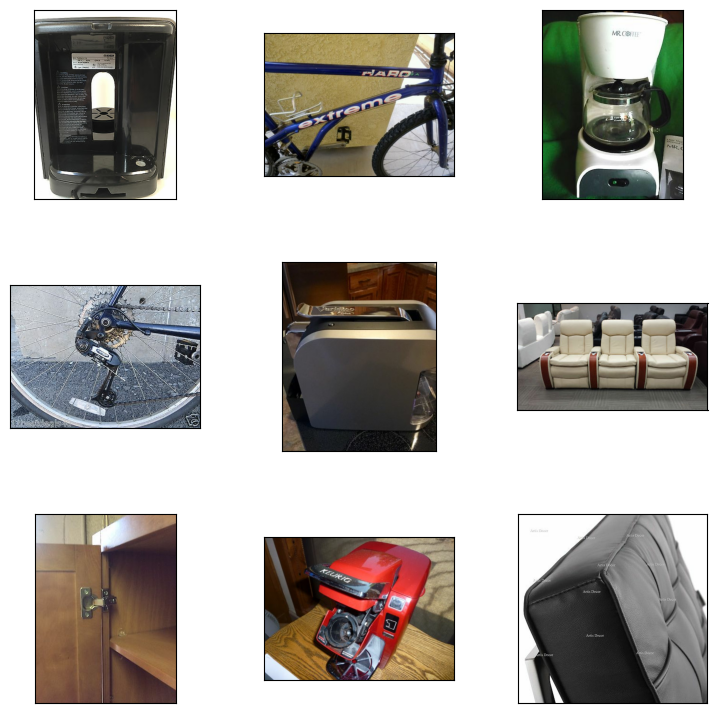

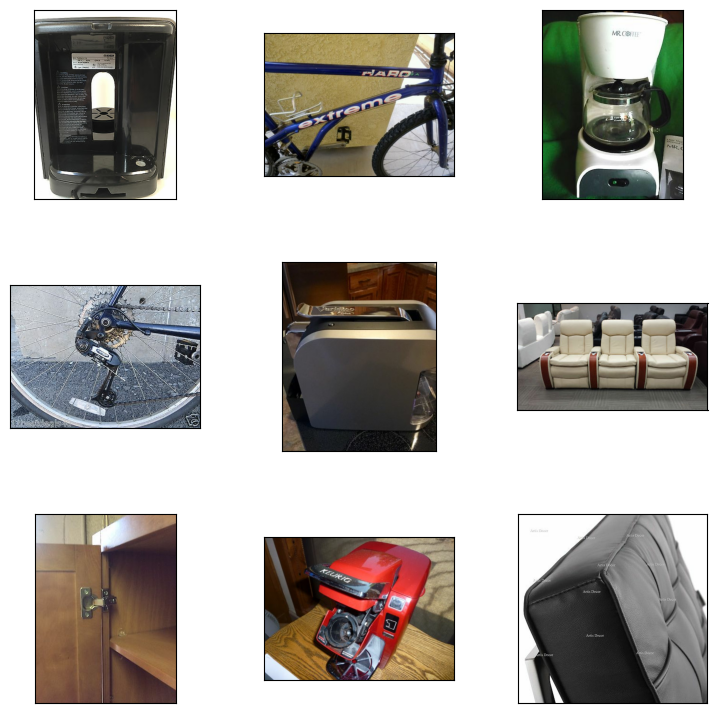

In [5]:
#Otra forma de mostrar ejemplos del set
tfds.show_examples(datos['train'], metadatos)

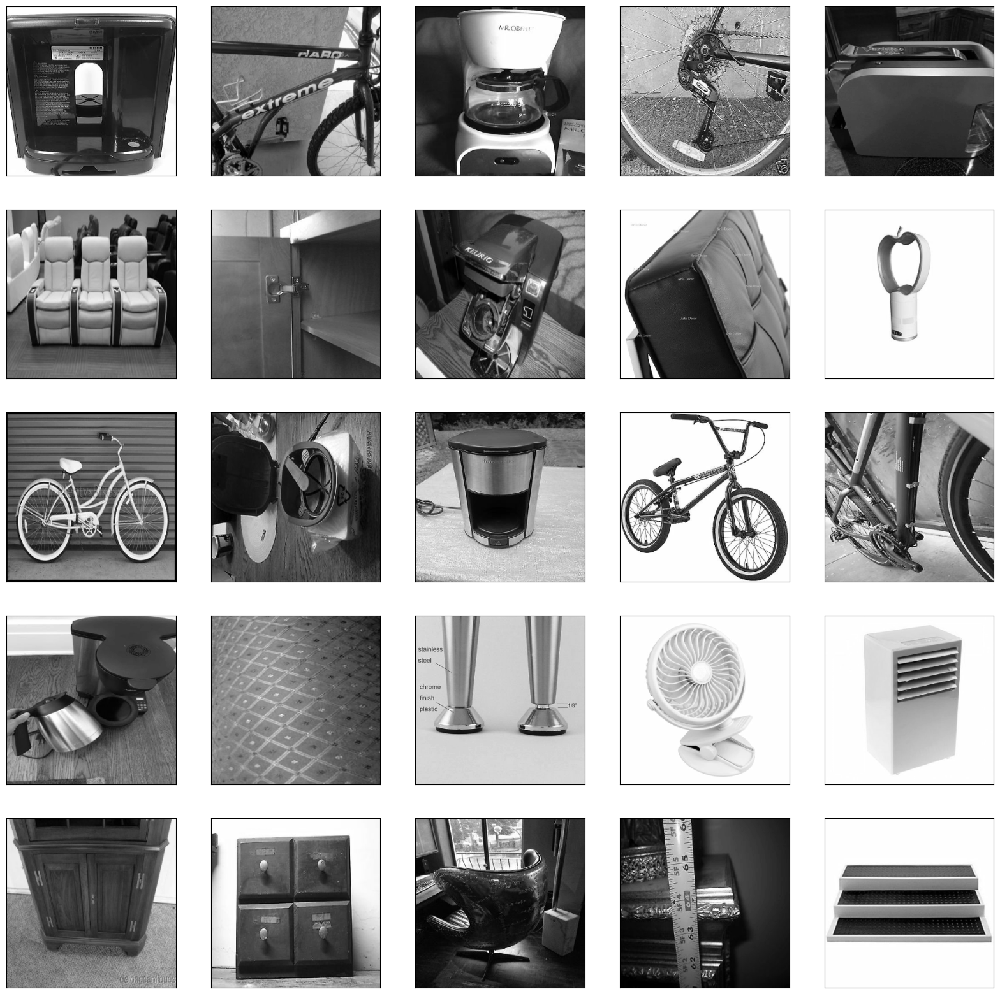

In [6]:
#Manipular y visualizar el set
#Lo pasamos a TAMANO_IMG (100x100) y a blanco y negro (solo para visualizar)
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=300

for i, ejemplo in enumerate(datos['train'].take(25)):  # `ejemplo` es un diccionario
    imagen = ejemplo['image']  # Acceder a la imagen en el diccionario
    etiqueta = ejemplo['super_class_id']  # Acceder a la etiqueta (super_class_id)
    imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen, cmap='gray')


In [7]:
#Variable que contendra todos los pares de los datos (imagen y etiqueta) ya modificados (blanco y negro, 100x100)
datos_entrenamiento = []

In [8]:
for i, ejemplo in enumerate(datos['train']):  # Accede al diccionario
    imagen = ejemplo['image']  # Extraer la imagen del diccionario
    etiqueta = ejemplo['super_class_id']  # Extraer la etiqueta

    # Convertir la imagen de tensor a numpy array y procesarla
    imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))  # Redimensionar imagen
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)  # Convertir a escala de grises
    imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)  # Redimensionar a (100, 100, 1) para tener un canal

    datos_entrenamiento.append([imagen, etiqueta])  # Añadir imagen y etiqueta a la lista

In [9]:
#Ver los datos del primer indice
datos_entrenamiento[0]

[array([[[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        ...,
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=3>]

In [10]:
#Ver cuantos datos tengo en la variable
len(datos_entrenamiento)

23839

In [11]:
#Preparar mis variables X (entradas) y y (etiquetas) separadas

X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [12]:
X

[array([[[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        ...,
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]]], dtype=uint8),
 array([[[114],
         [119],
         [118],
         ...,
         [ 33],
         [ 35],
         [ 38]],
 
        [[115],
         [116],
         [122],
         ...,
         [ 37],
         [ 39],
         [ 41]],
 
        [[115],
         [116],
         [123],
         ...,
      

In [13]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [14]:
y

[<tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64

In [15]:
#Convertir etiquetas en arreglo simple
y = np.array(y)

In [16]:
X.shape

(23839, 300, 300, 1)

In [31]:
import gc
gc.collect()

19805

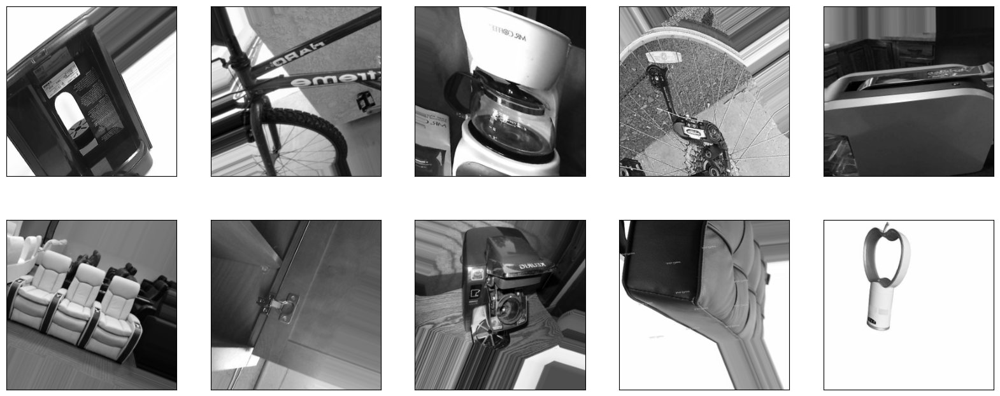

In [19]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(300, 300), cmap="gray")
  break

In [20]:
modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.InputLayer(input_shape=(TAMANO_IMG, TAMANO_IMG, 1)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [21]:
from tensorflow.keras.optimizers import AdamW

optimizer = AdamW(learning_rate=1e-4, weight_decay=1e-5)
modeloCNN_AD.compile(optimizer=optimizer,
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])

In [62]:
from tensorflow.keras.callbacks import TensorBoard

#Cargar la extension de tensorboard de colab
%load_ext tensorboard
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12339), started 1:07:01 ago. (Use '!kill 12339' to kill it.)

<IPython.core.display.Javascript object>

In [23]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #20200


20263.149999999998

In [24]:
len(X) - 20200 #3639

3639

In [25]:
X_entrenamiento = X[:20200]
X_validacion = X[20200:]

y_entrenamiento = y[:20200]
y_validacion = y[20200:]

In [26]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [27]:
dataset_entrenamiento = tf.data.Dataset.from_tensor_slices((X_entrenamiento, y_entrenamiento))
dataset_entrenamiento = dataset_entrenamiento.batch(32).repeat()

In [28]:
dataset_validacion = tf.data.Dataset.from_tensor_slices((X_validacion, y_validacion))
dataset_validacion = dataset_validacion.batch(32)

In [29]:
steps_per_epoch = int(np.ceil(len(X_entrenamiento) / float(32)))
validation_steps = int(np.ceil(len(X_validacion) / 32))

In [30]:
# Crear el callback de TensorBoard
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

# Entrenamiento sin validación, con callback de TensorBoard
historial = modeloCNN_AD.fit(
    dataset_entrenamiento,
    epochs=150,  # Número de épocas
    steps_per_epoch=steps_per_epoch,
    callbacks=[tensorboardCNN_AD]  # Añadir el callback aquí
)

# Evaluar el conjunto de validación por separado
val_loss, val_accuracy = modeloCNN_AD.evaluate(dataset_validacion, steps=validation_steps)

Epoch 1/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - accuracy: 0.2901 - loss: 1.5289
Epoch 2/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.4556 - loss: 1.2899
Epoch 3/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.5343 - loss: 1.1664
Epoch 4/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.5800 - loss: 1.0741
Epoch 5/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.6235 - loss: 0.9836
Epoch 6/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.6604 - loss: 0.9118
Epoch 7/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.6816 - loss: 0.8504
Epoch 8/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.7129 - loss: 0.7762
Epoch 9/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.7313 - loss: 0.7320
Epoch 10/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.7560 - loss: 0.6570
Epoch 11/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.7873 - loss: 0.5931
Epoch 12/150
632/63

In [32]:
with tf.summary.create_file_writer('logs/cnn_AD/validation').as_default():
    tf.summary.scalar('val_loss', val_loss, step=150)
    tf.summary.scalar('val_accuracy', val_accuracy, step=150)

In [34]:
print(modeloCNN_AD.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 298, 298, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 149, 149, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 147, 147, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 73, 73, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 71, 71, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 35, 35, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 33, 33, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      16,777,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 51,596,561 (196.83 MB)

 Trainable params: 17,198,853 (65.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 34,397,708 (131.22 MB)

None


In [33]:
modeloCNN_AD.export('saved_model_directory')

Saved artifact at 'saved_model_directory'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 300, 300, 1), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  138930173063264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173063792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173065728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173063968: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173064848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173005488: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173002848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173007248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173002320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173009008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138930173

In [59]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 96.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 119.0 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.1
    Uninstalling packaging-24.1:
      Successfully uninstalled packaging-24.1


In [35]:
!mkdir carpeta_salida_keras

In [60]:
!tensorflowjs_converter --input_format=tf_saved_model --output_format=tfjs_graph_model saved_model_directory carpeta_salida_keras


2024-09-27 09:13:25.380692: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-27 09:13:25.402352: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-27 09:13:25.408931: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-27 09:13:26.621243: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-09-27 09:13:29.473975: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1727428409.82

In [38]:
# Instalar PIL
!pip install Pillow


In [40]:
from PIL import Image
import numpy as np
import tensorflow as tf


# Función para cargar y procesar la imagen
def cargar_y_procesar_imagen(ruta_imagen):
    # Cargar la imagen desde la ruta
    imagen = Image.open(ruta_imagen)

    # Redimensionar la imagen a 200x200
    imagen = imagen.resize((300, 300))

    # Convertir la imagen a escala de grises (si es necesario)
    imagen = imagen.convert('L')  # L convierte a escala de grises

    # Convertir la imagen a un array numpy y normalizarla
    imagen_array = np.array(imagen).astype('float32') / 255.0

    # Redimensionar para cumplir con la forma de entrada del modelo: (1, 150, 150, 1)
    imagen_array = np.expand_dims(imagen_array, axis=-1)  # Añadir el canal
    imagen_array = np.expand_dims(imagen_array, axis=0)   # Añadir el lote

    return imagen_array

# Función para realizar la predicción
def predecir_imagen(modelo, imagen_preprocesada):
    # Realizar la predicción
    prediccion = modelo.predict(imagen_preprocesada)

    # Obtener la clase con mayor probabilidad
    clase_predicha = np.argmax(prediccion)

    return clase_predicha




In [57]:
# Probar con una imagen del servidor local
ruta_imagen = 'bici.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
El modelo predice que la imagen es: Bicycle


In [54]:
# Probar con una imagen del servidor local
ruta_imagen = 'armario.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
El modelo predice que la imagen es: Cabinet


In [44]:
# Probar con una imagen del servidor local
ruta_imagen = 'silla.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
El modelo predice que la imagen es: Chair


In [50]:
# Probar con una imagen del servidor local
ruta_imagen = 'coffee maker_14.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
El modelo predice que la imagen es: Coffee Maker


In [47]:
# Probar con una imagen del servidor local
ruta_imagen = 'ven.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
El modelo predice que la imagen es: Fan


In [61]:
import shutil

# Nombre de la carpeta que deseas comprimir
carpeta_a_comprimir = 'carpeta_salida_keras'

# Nombre del archivo ZIP de salida
nombre_archivo_zip = 'salida_comprimida_keras'

# Comprimir la carpeta en un archivo ZIP
shutil.make_archive(nombre_archivo_zip, 'zip', carpeta_a_comprimir)

print(f"Carpeta '{carpeta_a_comprimir}' comprimida como '{nombre_archivo_zip}.zip'")


Carpeta 'carpeta_salida_keras' comprimida como 'salida_comprimida_keras.zip'
